In [2]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
from operator import itemgetter
from PIL import Image, ImageOps
import pytesseract
import pyocr
import pyocr.builders
import json
import sys
import os
import glob
import re
import math
import itertools

In [27]:
# OCR Resultを表示
def main():
    sheet_path = '/data/matuzaki/sisha-split'
    save_dir = '/data2/abababam1/HandwrittenTextAlign/toda_char_imgs_new'
    
    OCRfailed = []
    
    for path in glob.glob(f'{sheet_path}/*.tif/*.tif', recursive=True):
        school_class = os.path.splitext(path.split('/')[-2])[0]
        save_dir_imgs = os.path.join(save_dir, school_class)
        os.makedirs(save_dir_imgs, exist_ok=True)
        
        char_from_scan(path, save_dir_imgs, i = 1)
        
if __name__ == "__main__":
    main()

OCR Result: 'S3-67'
OCR Result: 'S3-45'
OCR Result: 'S3-65'
OCR Result: 'S3-93'
OCR Result: 'S3-06'
OCR Result: 'S3-49'
OCR Result: 'S3-63'
OCR Result: 'S3-48'
OCR Result: 'S3-47'
OCR Result: 'S3-04'
OCR Result: 'S3-46'
OCR Result: 'S3-99'
OCR Result: 'S3-92'
OCR Result: 'S3-62'
OCR Result: 'S3-95'
OCR Result: 'S3-61'
OCR Result: 'S3-66'
OCR Result: 'S3-60'
OCR Result: 'S3-64'
OCR Result: 'S3-08'
OCR Result: 'S3-57'
OCR Result: 'S2-93'
OCR Result: 'S2-94'
OCR Result: 'S2-106'
OCR Result: 'S2-105'
OCR Result: 'S2-83'
OCR Result: 'S2-102'
OCR Result: 'S2-89'
OCR Result: 'S2-84'
OCR Result: 'S2-100'
OCR Result: 'S2-98'
OCR Result: 'S2-19'
OCR Result: 'S2-81'
OCR Result: 'S2-108'
OCR Result: 'S2-90'
OCR Result: 'S2-97'
OCR Result: 'S2-95'
OCR Result: '92-1195'
OCR Result: 'S2-92'
OCR Result: 'S2-87'
OCR Result: 'S2-91'
OCR Result: 'S2-80'
OCR Result: 'S2-116'
OCR Result: 'S2-85'
OCR Result: 'S2-88'
OCR Result: 'S2-82'
OCR Result: 'S2-114'
OCR Result: 'S2-96'
OCR Result: 'S2-117'
OCR Result

In [26]:
def char_from_scan(input_img, save_dir, i):
    school_class = os.path.splitext(input_img.split('/')[-2])[0]
    file_name = os.path.splitext(os.path.basename(input_img))[0] # xaaa
    writer = file_name.split('_')[0]
    
    # スキャン結果を読み込み
    scan_img = Image.open(input_img)
    width, height = scan_img.size
    
    # 剪定範囲を設定(手書き字がある部分だけ取り出す)
    
    # シート名OCR
    try:
        numberd_img = scan_img.crop((0, 0, 1000, 350))
        number = pytesseract.image_to_string(numberd_img, lang = 'eng', config= \
                                                 '-c tessedit_char_whitelist="0123456789Ss-ー" --user-patterns PATH: /home/abababam1/HandwrittenTextAlign/toda_crop_imgs/userpattern.txt')
        if number == '':
            numberd_img = scan_img.crop((0, height - 300, 1000, height))
            number = pytesseract.image_to_string(numberd_img, lang = 'eng', config= \
                                                 '-c tessedit_char_whitelist="0123456789Ss-ー" --user-patterns PATH: /home/abababam1/HandwrittenTextAlign/toda_crop_imgs/userpattern.txt')
            #numberd_img = numberd_img.resize((numberd_img.width, numberd_img.height * 4))
    except Exception as e:
        print(f"OCR failed: {e}")
        number = '_'
    
    # OCR結果下処理
    number = re.sub(r"[\n $']", '', number)
    # '-'が抜けてしまった時に対応
    if '-' not in number:
        number = number[:2] + '-' + number[2:]
    # 先頭をSに揃える
    if number[0] != 'S' and len(number) in [4, 5, 6]:
        number = re.sub('^[0-9s]', 'S', number)
        
    print(f"OCR Result: '{number}'")
    numberd_img.save(f'/home/abababam1/HandwrittenTextAlign/test/number/{number}_{school_class}_{file_name}.png')

In [28]:
# OCRした結果を画像と共に可視化

# 戸田市小学校 ID読み取り失敗: OCR Result: %
import os
from PIL import Image
import matplotlib.pyplot as plt

directory = '/home/abababam1/HandwrittenTextAlign/test/number/'

# ディレクトリから画像ファイルのリストを取得（画像ファイルのみを取得）
files = [os.path.join(directory, f) for f in sorted(os.listdir(directory))
         if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:]

# 画像の枚数
num_files = len(files)

# 行数を計算
num_rows = math.ceil(num_files / 5)

# 画像を表示
fig, axes = plt.subplots(num_rows, 5, figsize=(15, num_rows * 3))
axes = axes.flatten()  # axesを1次元配列に変換

for ax, img_path in zip(axes, files):
    img = Image.open(img_path)  # 画像を読み込む
    ax.imshow(img)  # imshowを使って画像を表示
    ax.axis('off')  # 軸を非表示にする
    ax.set_title(f'{os.path.basename(img_path)}')

plt.tight_layout()
plt.show()

In [33]:
# OCRfailed
OCRfailed = [['S1-125', 'sasame-1-2', 'xaah'], ['S3-5', 'sasame-3-1', 'xaae'], ['S2-230', 'bijogi-2-4', 'xaad'], ['S2-115', 'bijogi-2-1', 'xaba'], ['S1-14', 'miyamoto-1-1', 'xaan'], ['S3-30', 'sasame-3-1', 'xaad'], ['S1-17', 'miyamoto-1-1', 'xaaq'], ['S1-7', 'miyamoto-1-1', 'xaaa'], ['S1-155', 'bijogi-1-1', 'xaaw'], ['S1-159', 'bijogi-1-1', 'xabd'], ['S1-115', 'sasame-1-2', 'xaap'], ['S1-172', 'bijogi-1-1', 'xaad'], ['S1-77', 'sasame-1-1', 'xaap'], ['S1-95', 'sasame-1-1', 'xaac'], ['S1-227', 'bijogi-1-3', 'xaaf'], ['S2-70', 'sasame-2-3', 'xaar'], ['S2-56', 'sasame-2-3', 'xabf'], ['S2-57', 'sasame-2-3', 'xaam'], ['S2-58', 'sasame-2-3', 'xabc'], ['S2-71', 'sasame-2-3', 'xaai'], ['S2-145', 'bijogi-2-2', 'xaal'], ['S2-159', 'bijogi-2-3', 'xaax'], ['S2-211', 'bijogi-2-4', 'xaaw'], ['S2-65', 'sasame-2-3', 'xaaq'], ['S2-218', 'bijogi-2-4', 'xaac'], ['S2-223', 'bijogi-2-4', 'xaaa'], ['S2-5', 'sasame-2-3', 'xaad'], ['S2-50', 'sasame-2-3', 'xaaf'], ['S2-52', 'sasame-2-3', 'xaan'], ['S2-55', 'sasame-2-3', 'xabb'], ['S3-54', 'sasame-3-3', 'xaak'], ['S3-56', 'sasame-3-3', 'xaaq'], ['S3-58', 'sasame-3-3', 'xaat'], ['S3-17', 'sasame-3-1', 'xaam'], ['S3-52', 'sasame-3-3', 'xaad'], ['S3-53', 'sasame-3-3', 'xaac'], ['S3-55', 'sasame-3-3', 'xaal'], ['S3-59', 'sasame-3-3', 'xaas'], ['S3-7','sasame-3-1', 'xaag'], ['S2-207', 'bijogi-2-4', 'xaaq']]
len(OCRfailed)

40

In [36]:
def remove_OCRfailed(OCRfailed):
    OCRfailed_path = []
    for ID, school, filename in OCRfailed:
        path = '/data/matuzaki/sisha-split/'+f'{school}.tif'+'/'+f'{filename}.tif'
        OCRfailed_path.append(path)
    return OCRfailed_path

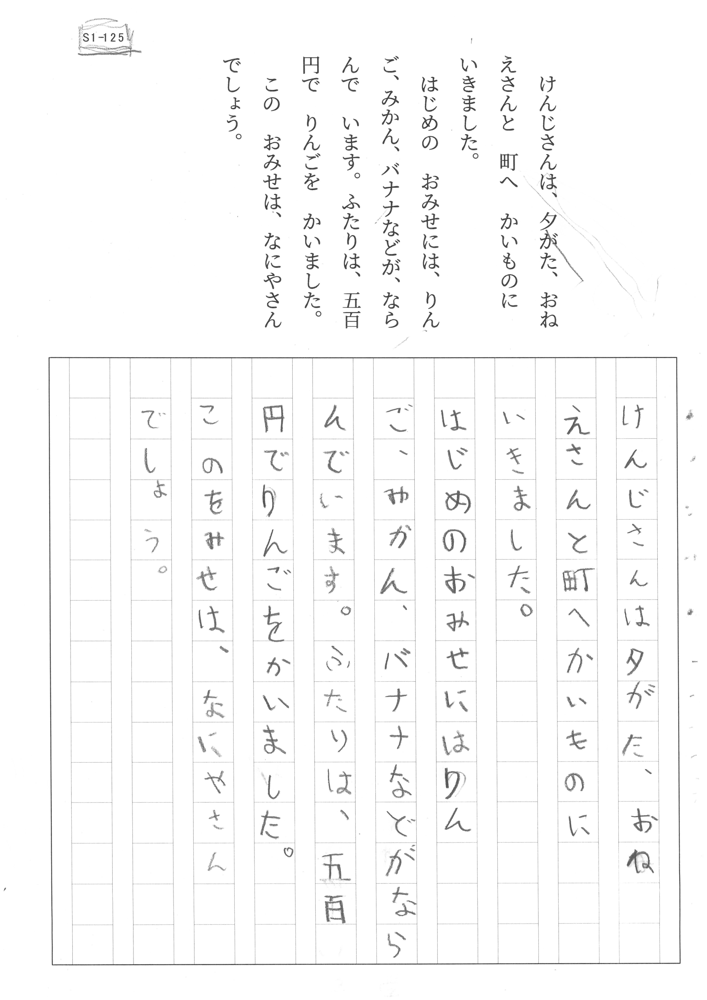

In [30]:
path = '/data/matuzaki/sisha-split/sasame-1-2.tif/xaah.tif'
image = Image.open(path)
image

In [2]:
all(abs(25 - henn) <= 5 for henn in [10, 20])

False